# Visualizing Riemann's mapping theorem

> Note: Following code is provided as-is. It is working currently with [`conda 4.13.0`](https://anaconda.org/) after running the following commands:
> ```
> conda install -c anaconda jupyter
> conda install -c conda-forge shapely
> conda install -c conda-forge tqdm
> conda install -c conda-forge matplotlib
> conda install -c anaconda sympy
> conda install -c conda-forge svgpathtools
> ```
>
> **Important**: Running all the cells as-is will take several hours. Some cells are used to (un)pickle data but they use a boolean-guard to prevent them from running. Use them wisely to save the results of your calculations.

Following code was written while exploring numerically a mathematical result known as the [Riemann mapping theorem](https://en.wikipedia.org/wiki/Riemann_mapping_theorem). It states roughly:

> any domain without holes can be transformed into a disk in an angle-preserving manner

A common proof for Riemann's mapping theorem due to Paul Koebe is based on the application of a square root function. This repeated application of square root makes the area grow gradually. The trick is to prove that this growing is bounded from above.

This code was used to generate the visualization video of the Riemann mapping theorem: [`https://www.youtube.com/watch?v=BOe_X9DEyq8`](https://www.youtube.com/watch?v=BOe_X9DEyq8)

In [140]:
from shapely import affinity
from tqdm.auto import tqdm, trange

import matplotlib.pyplot as plt
import numpy as np
import shapely.geometry
import sympy

import json
import math

In [7]:
with open('simply_connected.geojson', 'r') as f:
    finland = shapely.geometry.shape(json.load(f))

In [8]:
finland
STEP = 0.25

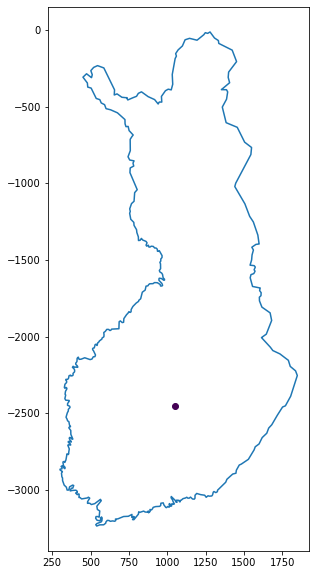

In [128]:
%matplotlib inline

def to_pointlist(start, end, step, include_endpoint=False):
    "Divide a path between two points to an evenly spaced segment"
    length = np.abs(end-start)
    return np.linspace(start, end, num=int(math.floor(length/step)), endpoint=include_endpoint)

def to_path(coords, step=STEP):
    raw_polyline = np.array([complex(*c) for c in coords])
    without_last_point = np.array([point for start, end in np.stack([raw_polyline[:-1], raw_polyline[1:]], axis=1) for point in to_pointlist(start, end, step=step)])
    return np.concatenate([without_last_point, raw_polyline[-1:]])

fig, ax = plt.subplots(figsize=(10,10))

polyline = to_path(finland.exterior.coords)
ax.set_aspect('equal')
ax.plot(polyline.real, polyline.imag)

z0 = 1050 -2450j
ax.scatter(z0.real, z0.imag, c=30000)

plt.show()

When intersecting `shapely.geometry.LineString`s the resulting set might be a `Point`, `Linestring` or a `MultiLineString` and rarely a `LineString` with empty coordinates. 

In [10]:
def to_linestring_list(geometry):
    "Normalize `geometry` to a list of LineStrings"
    if isinstance(geometry, shapely.geometry.MultiLineString):
        return list(geometry.geoms)
    elif isinstance(geometry, shapely.geometry.Point) or not geometry.coords:
        return []
    else:
        return [geometry]


# Add gridlines to the geometry

We desire to visualize a rectangular grid with the rectangle to visualize the transformation.

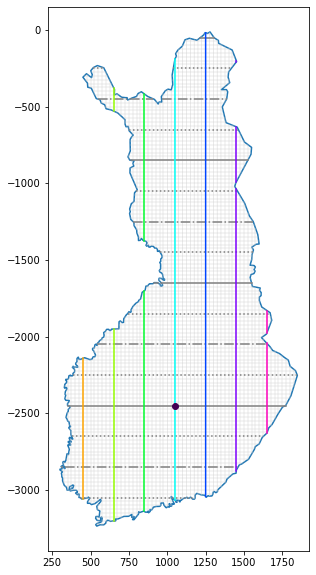

In [16]:
%matplotlib inline

class GridPlotter(object):
    def __init__(self, grid_lines, grids, masks, major_ticks, creator=None):
        "Do not initialize directly but use the `GridPlotter.create` function"
        self.horizontal_gridlines, self.vertical_gridlines = grid_lines
        self.horizontal_grid, self.vertical_grid = grids
        self.horizontal_mask, self.vertical_mask = masks
        self.major_ticks = major_ticks
        self.creator = creator

    @staticmethod
    def create(polygon, sep, center, major_ticks=8, step=2.5, creator=None):
        """
        Initialize a grid for `polygon`
        
        - `sep` defines the grid size
        - `center` defines the origin for the grid
        - Every `major_ticks`th grid line will be consider "major" and will be mapped more prominently
        - `step` is the step size when transforming a grid line to a polyline
        - `creator` is an internal parameter to enable smooth subclassing
        """
        left, bottom, right, top = polygon.bounds
        major_ticks = major_ticks

        # Snap the bounds to grid
        left = left - (left - center.real) % sep
        right = right + (center.real - right) % sep
        bottom = bottom - (bottom - center.imag) % sep
        top = top + (center.imag - top) % sep


        xs = np.arange(left, right + sep * 0.5, sep)

        vertical_segments = []
        vertical_grid = np.round((xs - center.real ) / sep)
        vertical_coords = []
        for idx, x in enumerate(xs):
            grid_line = shapely.geometry.LineString([[x, top], [x, bottom]])
            for segment in to_linestring_list(polygon.intersection(grid_line)):
                linestring = to_pointlist(*[complex(x, y) for x, y in segment.coords], step=step, include_endpoint=True)
                if linestring.size > 0:
                    vertical_segments.append(linestring)
                    vertical_coords.append(vertical_grid[idx])
        vertical_gridlines = vertical_segments
        vertical_grid = np.array(vertical_coords, dtype=int)
        vertical_mask = vertical_grid % major_ticks == 0

        ys = np.arange(bottom, top + sep * 0.5, sep)
        
        horizontal_segments = []
        horizontal_grid = np.round((ys - center.imag ) / sep)
        horizontal_coords = []
        for idx, y in enumerate(ys):
            grid_line = shapely.geometry.LineString([[left, y], [right, y]])
            for segment in to_linestring_list(polygon.intersection(grid_line)):
                linestring = to_pointlist(*[complex(x, y) for x, y in segment.coords], step=step, include_endpoint=True)
                if linestring.size > 0:
                    horizontal_segments.append(linestring)
                    horizontal_coords.append(horizontal_grid[idx])

        horizontal_gridlines = horizontal_segments
        horizontal_grid = np.array(horizontal_coords, dtype=int)
        horizontal_mask = horizontal_grid % major_ticks == 0
        
        if creator is None:
            creator = GridPlotter

        return creator(
            [horizontal_gridlines, vertical_gridlines],
            [horizontal_grid, vertical_grid],
            [horizontal_mask, vertical_mask],
            major_ticks,
            creator=creator,
        )

    def copy(self):
        if self.creator is None:
            creator = self.__class__
        else:
            creator = self.creator
            
        return creator(
            [self.horizontal_gridlines, self.vertical_gridlines],
            [self.horizontal_grid, self.vertical_grid],
            [self.horizontal_mask, self.vertical_mask],
            self.major_ticks,
        )
        
    def apply(self, transform):
        self.horizontal_gridlines = [transform(e) for e in self.horizontal_gridlines]
        self.vertical_gridlines = [transform(e) for e in self.vertical_gridlines]

    def transform(self, transform):
        obj = self.copy()
        obj.apply(transform)
        return obj

    def initialize_colors(self):
        self.hoffset = self.horizontal_grid.min()
        self.hcolors = plt.cm.coolwarm(np.linspace(0, 1, self.horizontal_grid.max() - self.hoffset + 1))
        self.voffset = np.abs(self.vertical_grid).max()
        self.vcolors = plt.cm.hsv(np.linspace(0, 1, 2 * self.voffset + 1))
        self._color = True

    def get_hkwargs(self, idx):
        if not hasattr(self, '_color'):
            self.initialize_colors()
        # Only works for major ticks
        coords = self.horizontal_grid[idx] // self.major_ticks
        if coords % 4 == 0:
            linestyle = '-'
        elif coords % 2 == 0:
            linestyle = '-.'
        else:
            linestyle = ':'
        return dict(c='0.5', linestyle=linestyle)
        return dict(c=self.hcolors[self.horizontal_grid[idx] - self.hoffset])

    def get_default_kwargs(self):
        return {'c':'0.8', 'linewidth': 0.4}
    
    def get_vkwargs(self, idx):
        if not hasattr(self, '_color'):
            self.initialize_colors()

        return dict(c=self.vcolors[self.vertical_grid[idx] + self.voffset])
        
    def plot_all(self, ax, **kwargs):
        plots = []
        if not kwargs:
            kwargs = self.get_default_kwargs()
        for line in self.horizontal_gridlines:
            plot, = ax.plot(line.real, line.imag, **kwargs)
            plots.append(plot)

        for line in self.vertical_gridlines:
            plot, = ax.plot(line.real, line.imag, **kwargs)
            plots.append(plot)
        
        return plots

    def plot(self, ax):
        "Plot the 'major' grid lines using the matplotlib Axes object `ax`"
        plots = []
        for idx in np.where(self.horizontal_mask)[0]:
            line = self.horizontal_gridlines[idx]
            plot, = ax.plot(line.real, line.imag, **self.get_hkwargs(idx))
            plots.append(plot)

        for idx in np.where(self.vertical_mask)[0]:
            line = self.vertical_gridlines[idx]
            plot, = ax.plot(line.real, line.imag, **self.get_vkwargs(idx))
            plots.append(plot)

        return plots

    def _get_plots_for_animation(self, ax):
        plots = []
        plots.extend(self.plot_all(ax))
        plots.extend(self.plot(ax))
        return plots

    def _get_segments_for_animation(self):
        # N.B. The order of segments needs to be the same as in `get_plots_for_animation`
        for line in self.horizontal_gridlines:
            yield line
        for line in self.vertical_gridlines:
            yield line
        for idx in np.where(self.horizontal_mask)[0]:
            yield self.horizontal_gridlines[idx]
        for idx in np.where(self.vertical_mask)[0]:
            yield self.vertical_gridlines[idx]




grid_plotter = GridPlotter.create(finland, sep=25, center=z0, major_ticks=8, step=2.5)

fig, ax = plt.subplots(figsize=(10,10))

ax.set_aspect('equal')
ax.plot(*finland.exterior.xy)
grid_plotter.plot_all(ax)
grid_plotter.plot(ax)
    
ax.scatter(z0.real, z0.imag, c=30000, zorder=3)

plt.savefig('finland_original.eps', bbox_inches='tight')

# Example 1 of a Moebius transform: square

Demonstrate the code so far on a square with a Moebius transform.

In [17]:
def create_square(length, translate=None):
    if translate == None:
        translate = (0,0)
    domain = shapely.geometry.Polygon([(0., 0.), (0., length), (length, length), (length, 0.), (0., 0.)])
    return shapely.affinity.translate(domain, *translate)


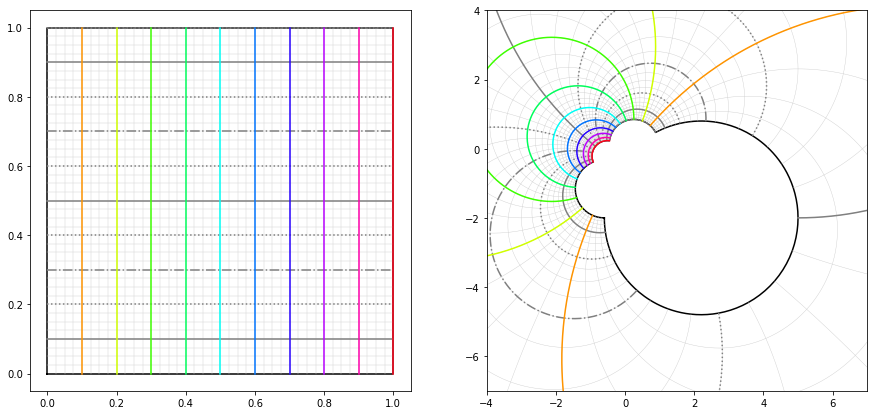

In [129]:
%matplotlib inline

fig, axes = plt.subplots(ncols=2, figsize=(15,7))

def do_stuff(sep=0.025, major_ticks=4, step=0.001, z0=0.5+0.5j):
    domain = create_square(1)

    grid_plotter = GridPlotter.create(domain, sep=sep, center=z0, major_ticks=major_ticks, step=step)
    polyline = to_path(domain.exterior.coords, step=0.005)


    foo = 0.6+ 2j

    a, b, c, d = 1, -foo, -foo.conjugate(), 1

    transformations = [lambda z: z, lambda z: (a*z + b) / (c*z+d)]

    for idx, t in enumerate(transformations):
        ax = axes[idx]

        p = t(polyline)
        g = grid_plotter.transform(t)

        ax.set_aspect('equal')
        ax.plot(p.real, p.imag, c='k')

        g.plot_all(ax)
        g.plot(ax)
#         points = np.array(points)
#         ax.scatter(points.real, points.imag, zorder=3, c='k')


    axes[1].set_xlim([-4, 7])
    axes[1].set_ylim([-7, 4])
do_stuff()

# Example 2 of a Moebius transform: upper half plane

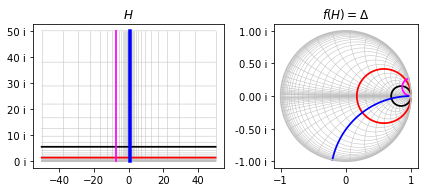

In [20]:
%matplotlib inline

import matplotlib.ticker as mticker 
from matplotlib import gridspec

fig = plt.figure(figsize=(6,3))

gs = gridspec.GridSpec(1, 2, width_ratios=[2,1.5])

axes = [plt.subplot(gs[0]), plt.subplot(gs[1])]

def map_upper_half_plane(grid_line_coeff, STEP):
    left, right, top, bottom = -50, 50, 50, 0
    
    xs = np.arange(left, right, (right-left) * STEP/2)
    xs = np.linspace(left, right, grid_line_coeff * 8)
    xs = np.geomspace(0.01, right, grid_line_coeff * 16)
    # Add the negative axis as well
    xs = np.concatenate([-xs[::-1], [0], xs])
    

    ys = np.arange(top, bottom, (bottom-top) * STEP/2)
    ys = np.geomspace(top, 0.01, grid_line_coeff * 16)

    horizontal_gridlines = [shapely.geometry.LineString([[left, y], [right, y]]) for y in ys]
    vertical_gridlines = [shapely.geometry.LineString([[x, top], [x, bottom]]) for x in xs]
    
    grid_segments = [
        to_pointlist(*[complex(x, y) for x, y in segment.coords], step=STEP, include_endpoint=True)
        for grid_line_list in [horizontal_gridlines, vertical_gridlines]
        for segment in grid_line_list
    ]

    f = lambda z: (z - 1j)/(z+1j)

    circle = np.exp(-1j * np.linspace(0, 2*np.pi, 100))
    axes[0].set_aspect(1.5)
    axes[1].set_aspect('equal')
    axes[1].plot(circle.real, circle.imag, '0.75')
    
#     ax.plot(*finland.exterior.xy, c='blue')

    for idx, line in enumerate(grid_segments):
        color = '0.75'
        linewidth = 0.5
        highlight_width = 3.5 * linewidth
        extra_coeff = 1
        zorder = 0
        
        if idx == 8:
            color = 'k'
            linewidth = highlight_width
            zorder = 1
        if idx == 13:
            color = 'r'
            linewidth = highlight_width
            zorder = 1
        if idx == 39:
            extra_coeff = 2
            color = 'magenta'
            linewidth = highlight_width
            zorder = 1
        if idx == 81:
            color = 'b'
            extra_coeff = 2
            linewidth = extra_coeff * highlight_width
            zorder = 1

        axes[0].plot(line.real, line.imag, c=color, linewidth=linewidth, zorder=zorder)
        line = f(line)
        if not idx == 39:
            linewidth = linewidth / extra_coeff
        
        axes[1].plot(line.real, line.imag, c=color, linewidth=linewidth, zorder=zorder)
    
    axes[0].yaxis.set_major_formatter(mticker.FormatStrFormatter('%.f i'))
    axes[1].yaxis.set_major_formatter(mticker.FormatStrFormatter('%.2f i'))
#     ax.scatter(z0.real, z0.imag, c=30000)

map_upper_half_plane(grid_line_coeff=2, STEP=0.05)

fig.tight_layout(h_pad=4.5)

axes[0].set_title('$H$')
axes[1].set_title('$f(H) = \Delta$')

plt.savefig('upper_halfplane.eps', bbox_inches='tight')

# Example 3 of a Moebius transform: concentric circles

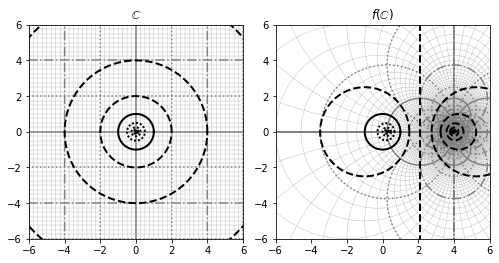

In [21]:
%matplotlib inline

fig, axes = plt.subplots(ncols=2, figsize=(7,4), subplot_kw={'aspect': 'equal', 'xlim': [-6,6], 'ylim': [-6, 6]})

b = -0.25
def unit_mapping(z, b):
    return (z - b)/(1 - b.conjugate()*z)

unit = lambda z: unit_mapping(z, -0.25)


radius = 250
sep = 0.25

domain = create_square(radius, translate=(-radius/2, -radius/2))

class BleakGridPlotter(GridPlotter):
    def get_default_kwargs(self):
        return {'c':'0.7', 'linewidth': 0.4}
        
    def get_vkwargs(self, idx):
        return self.get_hkwargs(idx)

plimplom = BleakGridPlotter.create(domain, sep=sep, center=0, major_ticks=8, step=0.05, creator=BleakGridPlotter)
ax = axes[0]

plimplom.plot_all(ax)
plimplom.plot(ax)

plimplom = plimplom.transform(unit)

ax = axes[1]
plimplom.plot_all(ax)
plimplom.plot(ax)

plot_circle = np.exp(np.linspace(0, 2j*np.pi, 256))


for power in range(-10,10, 1):    
    ax = axes[0]
    line_width = 2
    circle = plot_circle * (2 **power)
    if power < 0:
        line_style = (0, (1, 1))
    elif power == 0:
        line_width = 2
        line_style = 'solid'
    else:
        line_style = 'dashed'
#         line_style = (0, (4, 4, 1, 5))

    ax.plot(circle.real, circle.imag, linewidth=line_width, linestyle=line_style, c='k', zorder=100)
    circle = unit(circle)
    if power == 2:
        x = circle[0].real
        circle = np.array([x - 10j, x + 10j])

    axes[1].plot(circle.real, circle.imag, linewidth=line_width, linestyle=line_style, c='k', zorder=100)

# axes[1].plot([-4, 4], [0.47619047619047616, 0.47619047619047616])

axes[0].set_title('$\mathbb{C}$')
axes[1].set_title('$f(\mathbb{C})$')
fig.tight_layout(h_pad=4.5)
# plt.savefig('unit_mapping.eps', bbox_inches='tight')

# Preparations for the lemmas

A complex logarithm is needed with the lemmas. `np.log` has a fixed branch cut but since we are dealing with a point list with a small difference between successive points, we can use `np.unwrap` to eliminate unwanted jumps across branch cut.

In [22]:
def smooth_log(z):
    """
    Take a logarithm of each point in `z`
    
    and if the successive points jump across branch cut, smooth them.
    """
    logged = np.log(z)
    if hasattr(z, 'shape') and len(z.shape) == 1:
        return logged.real + 1j * np.unwrap(logged.imag)
    else:
        return logged

def log_inside(boundary):
    "Return a new logarithm which will restrict the results inside the `log(boundary)`"
    p_logged = smooth_log(boundary)
    angle_min, angle_max = p_logged.imag.min(), p_logged.imag.max()
    def log(z):
        z_logged = smooth_log(z)
        if z_logged.imag.min() > angle_max:
            z_logged -= 2j * np.pi
        elif z_logged.imag.max() < angle_min:
            z_logged += 2j * np.pi
        return z_logged

    return log

# Lemma 7.1

Or Lemma IX.3.2 in Palka

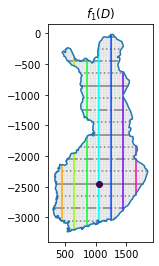

In [23]:
%matplotlib inline
fig, ax = plt.subplots()

def f1_(non_existing):
    def f1(x):
        return x - non_existing
    return f1

b = 0.

f1 = f1_(0.)
new_f = lambda z: f1(z)

new_polyline = new_f(polyline)
ax.set_title('$f_1(D)$')
ax.set_aspect('equal')

new_grid_plotter = grid_plotter.transform(new_f)
new_grid_plotter.plot_all(ax, c='0.8', linewidth=0.4)
new_grid_plotter.plot(ax)    

ax.scatter(z0.real, z0.imag, c=30000, zorder=3)
ax.plot(new_polyline.real, new_polyline.imag)

# plt.savefig('finland_f1.eps', bbox_inches='tight')

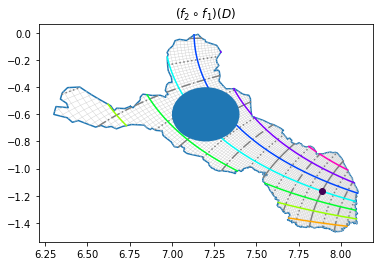

In [24]:
%matplotlib inline

fig, ax = plt.subplots()

f2 = smooth_log

w0 = 7.2 + -.6j
r = 0.2

new_f = lambda z: f2(f1(z))

new_polyline = new_f(polyline)
ax.plot(new_polyline.real,new_polyline.imag)

new_z0 = new_f(z0)
ax.scatter(new_z0.real, new_z0.imag, c=30, zorder=3)

new_grid_plotter = grid_plotter.transform(new_f)
new_grid_plotter.plot_all(ax, c='0.8', linewidth=0.4)
new_grid_plotter.plot(ax)

ax.add_patch(plt.Circle((w0.real, w0.imag), r, zorder=2))

# plt.savefig('finland_f1_f2.eps', bbox_inches='tight')
ax.set_title('$(f_2 \circ f_1)(D)$')
plt.show()


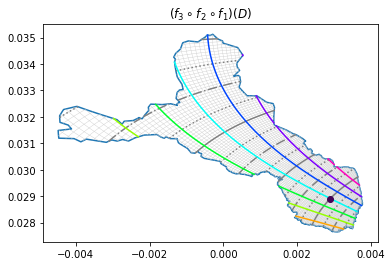

In [25]:
%matplotlib inline

fig, ax = plt.subplots()


def f3_(r, w0):
    def f3(z):
        return r/(z - w0 - 2j * np.pi)
    
    return f3

f3 = f3_(r, w0)
new_f = lambda z: f3(f2(f1(z)))

new_polyline = new_f(polyline)
ax.plot(new_polyline.real,new_polyline.imag)

new_z0 = new_f(z0)
ax.scatter(new_z0.real, new_z0.imag, c=30, zorder=3)

new_grid_plotter = grid_plotter.transform(new_f)
new_grid_plotter.plot_all(ax, c='0.8', linewidth=0.4)
new_grid_plotter.plot(ax)


# plt.savefig('finland_f1_f2_f3.eps', bbox_inches='tight')
ax.set_title('$(f_3 \circ f_2 \circ f_1)(D)$')
plt.show()

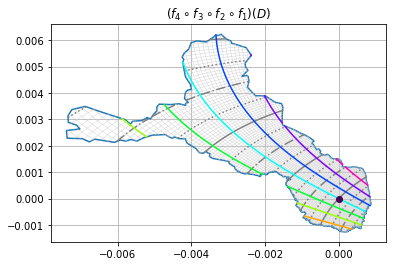

In [26]:
%matplotlib inline

# c = f3(f2(f1(z0)))

fig, ax = plt.subplots()

def f4_(c):
    def f4(z):
        return (z - c)/(1 - c.conj()*z)

    return f4

f4 = f4_(c=f3(f2(f1(z0))))
new_f = lambda z: f4(f3(f2(f1(z))))

new_polyline = new_f(polyline)
ax.plot(new_polyline.real,new_polyline.imag)

new_z0 = new_f(z0)
ax.scatter(new_z0.real, new_z0.imag, c=30, zorder=3)

new_grid_plotter = grid_plotter.transform(new_f)
new_grid_plotter.plot_all(ax, c='0.8', linewidth=0.4)
new_grid_plotter.plot(ax)

ax.grid(True, 'major')

# plt.savefig('finland_f1_f2_f3_f4.eps', bbox_inches='tight')
ax.set_title('$(f_4 \circ f_3 \circ f_2 \circ f_1)(D)$')
plt.show()

Plotting the $f_5$ is a bit trickier.

The derivative $(f_4 \circ f_3 \circ f_2 \circ f_1)'(z_0)$ can luckily be solved symbolically.

In [27]:
# Let's keep the namespace clean
class Derivative(object):
    import sympy
    from sympy import log, conjugate, symbols
    z, z0, r, b, w0 = symbols('z z0 r b w0')
    c = r/(log(z0 -b) - w0)

    f2 = log(z-b)
    f3 = r/(f2-w0)
    f4 = (f3 - c) / (1 - conjugate(c)*f3)

    def get_z0_differential(self):
        diff = sympy.diff(self.f4, self.z)
        return sympy.simplify(diff.evalf(subs={'z': 'z0'}))
    
    def evaluate(self, z0, r, b, w0):
        pre_f5 = self.get_z0_differential()
        deriv = sympy.lambdify([self.z0, self.r, self.b, self.w0], pre_f5)
        params = []
        return deriv(z0, r, b, w0)

    
Derivative().get_z0_differential()

-r*(conjugate(w0) - conjugate(log(-b + z0)))/((b - z0)*(w0 - log(-b + z0))*(r*conjugate(r) - 1.0*(w0 - log(-b + z0))*(conjugate(w0) - conjugate(log(-b + z0)))))

which evaluated with $z_0=1050 -2450j, b=0, r=0.2, w_0= 7.2 -.6i$ yields

d = $(f_4 \circ f_3 \circ f_2 \circ f_1)'(z_0)$ = 

In [28]:
d = Derivative().evaluate(
    z0=1050 -2450j, 
    r=0.2, 
    b=0., 
    w0=7.2 -.6j)
d

(8.219470965807402e-05-5.614134124030787e-05j)

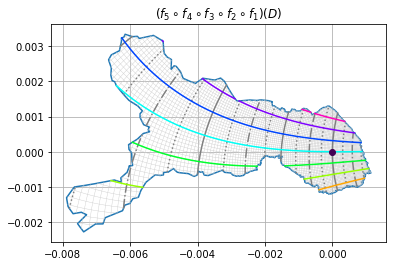

In [29]:
%matplotlib inline

fig, ax = plt.subplots()

u = np.exp(-1j * np.angle(d))
f5 = lambda z: u*z

new_f = lambda z: f5(f4(f3(f2(f1(z)))))

new_polyline = new_f(polyline)
ax.plot(new_polyline.real,new_polyline.imag)

new_z0 = new_f(z0)
ax.scatter(new_z0.real, new_z0.imag, c=30, zorder=3)

new_grid_plotter = grid_plotter.transform(new_f)
new_grid_plotter.plot_all(ax)
new_grid_plotter.plot(ax)

ax.grid(True, 'major')

# plt.savefig('finland_f1_f2_f3_f4_f5.eps', bbox_inches='tight')
ax.set_title('$(f_5 \circ f_4 \circ f_3 \circ f_2 \circ f_1)(D)$')
plt.show()

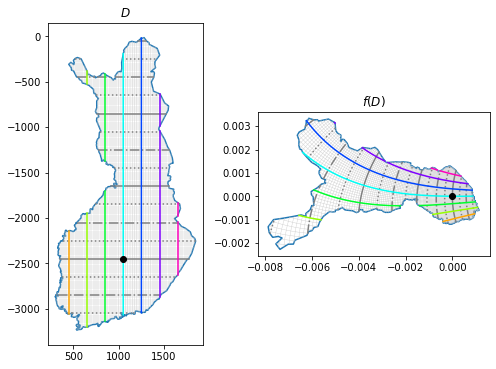

In [20]:
%matplotlib inline

fig = plt.figure(figsize=(7,7))

gs = gridspec.GridSpec(1, 2, width_ratios=[1,1.5])

axes = [plt.subplot(gs[0]), plt.subplot(gs[1])]

ax = axes[0]
ax.plot(polyline.real, polyline.imag)
grid_plotter.plot_all(ax)
grid_plotter.plot(ax)
ax.scatter(z0.real, z0.imag, c='k', zorder=14)
ax.set_title('$D$')

ax.set_aspect('equal')

ax = axes[1]
ax.plot(new_polyline.real, new_polyline.imag)
new_grid_plotter.plot_all(ax)
new_grid_plotter.plot(ax)
ax.set_aspect('equal')
ax.set_title('$f(D)$')
ax.scatter(0, 0, c='k', zorder=14)

fig.tight_layout(h_pad=1.5)
plt.savefig('finland_f.eps', bbox_inches='tight')

# Visualization of Lemma 7.1

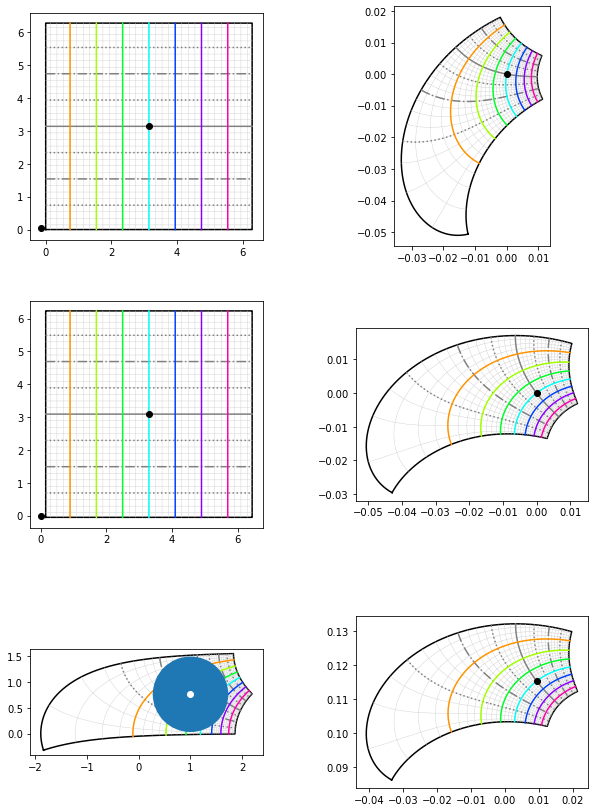

In [30]:
%matplotlib inline

plot_circle = np.exp(np.linspace(0, 2j*np.pi, 256))

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(10,15))
asdf = None
def do_the_lemma(domain, z0, b, r, w0, sep=0.1, major_ticks=4, step=0.01):
    grid_plotter = GridPlotter.create(domain, sep=sep, center=z0, major_ticks=major_ticks, step=step)

    polyline = to_path(domain.exterior.coords, step=step)

    f1 = f1_(b)
    f2 = log_inside(f1(polyline))
    f3 = f3_(r, w0)
    f4 = f4_(c=f3(f2(f1(z0))))
    
    d = Derivative().evaluate(
        z0=z0, 
        r=r, 
        b=b, 
        w0=w0)
    u = np.exp(-1j * np.angle(d))
    
    f5 = lambda z: u*z
    
    c = f3(f2(f1(z0)))
    transforms = [
        (lambda z: z, [b,z0]),
        (lambda z: f1(z), [0,f1(z0)]),
        (lambda z: f2(f1(z)), [w0]),
        (lambda z: f3(f2(f1(z))), [c]),
        (lambda z: f4(f3(f2(f1(z)))), [0]),
        (lambda z: f5(f4(f3(f2(f1(z))))), [0]),        
    ]
    ax_coords = {
        0: (0,0),
        1: (1,0),
        2: (2,0),
        3: (2,1),
        4: (1,1),
        5: (0,1),
    }

    for idx, (t, points) in enumerate(transforms):
        ax = axes[ax_coords[idx]]

        p = t(polyline)
        g = grid_plotter.transform(t)

        ax.set_aspect('equal')
        ax.plot(p.real, p.imag, c='k')

        g.plot_all(ax)
        g.plot(ax)
        points = np.array(points)
        point_color = 'k'
        if idx == 2:
            ax.add_patch(plt.Circle((w0.real, w0.imag), r, zorder=3))
            point_color = '1.0'
        
        ax.scatter(points.real, points.imag, zorder=5, c=point_color)
        
    
lemma_args = dict(domain=create_square(2 * np.pi), z0=np.complex_(np.pi*(1 + 1j)), sep=0.2, b=-.15+.05j, w0=1.+.76j, r=.73, step=0.001)


fig.subplots_adjust(wspace=0.4)

do_the_lemma( **lemma_args)
# plt.savefig('lemma_7_1.eps', bbox_inches='tight')


# Lemma 7.2

Or Lemma IX.7.3 in Palka.

Now $D = (f_4 \circ f_3 \circ f_2 \circ f_1)(D)$

Text(0.5, 1.0, '$g_1(D)$')

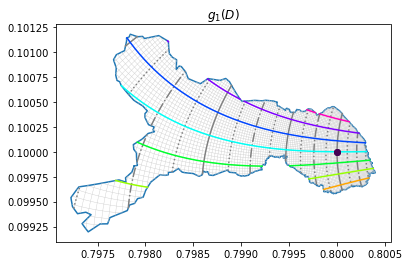

In [40]:
%matplotlib inline

fig, ax = plt.subplots()

b_for_g = complex(-0.8, -0.1)

def g1_(b):
    def g1(x):
        return (x - b)/(1 - b.conjugate()*x)
    return g1


g1 = g1_(b_for_g)
new_g = lambda z: g1(z)

renew_polyline = new_g(new_polyline)
ax.plot(renew_polyline.real,renew_polyline.imag)

renew_z0 = new_g(new_z0)
ax.scatter(renew_z0.real, renew_z0.imag, c=30, zorder=3)

# ax.scatter(b_for_g.real, b_for_g.imag, zorder=3)
ax.scatter(-b_for_g.real, -b_for_g.imag, c=3000, zorder=3)

renew_grid_plotter = new_grid_plotter.transform(new_g)
renew_grid_plotter.plot_all(ax)
renew_grid_plotter.plot(ax)

ax.set_title('$g_1(D)$')

Text(0.5, 1.0, '$(g_2 \\circ g_1)(D)$')

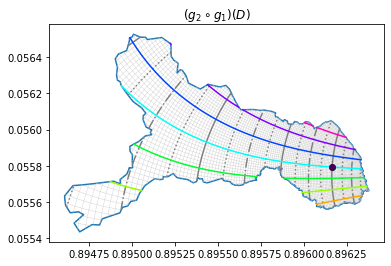

In [41]:
%matplotlib inline

fig, ax = plt.subplots()

def g2(x, boundary=None, n=2.0):
    "Take the `n`th root of x"
    if boundary is None:
        log = smooth_log
    else:
        log = log_inside(boundary)
    return np.exp(log(x)/n)

c_for_g = g2(-b_for_g)

new_g = lambda z: g2(g1(z))
new_g_bounded = lambda z: g2(g1(z), boundary=g1(new_polyline))

renew_polyline = new_g(new_polyline)
ax.plot(renew_polyline.real,renew_polyline.imag)

renew_z0 = new_g(new_z0)
ax.scatter(renew_z0.real, renew_z0.imag, c=30, zorder=3)
# ax.scatter(0, 0, c=30, zorder=3)
ax.scatter(c_for_g.real, c_for_g.imag)

renew_grid_plotter = new_grid_plotter.transform(new_g_bounded)
renew_grid_plotter.plot_all(ax)
renew_grid_plotter.plot(ax)

ax.set_title('$(g_2 \circ g_1)(D)$')


Text(0.5, 1.0, '$(g_3 \\circ g_2 \\circ g_1)(D)$')

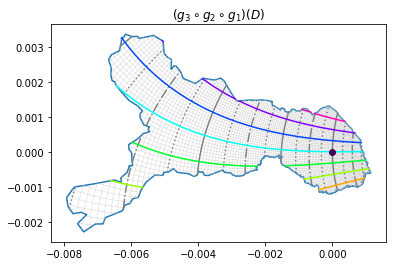

In [42]:
%matplotlib inline

fig, ax = plt.subplots()

def g3_(c):
    def g3(x):
        return np.exp(1j*np.angle(c))*(x - c)/(1 - c.conj()*x)
    return g3

g3 = g3_(c_for_g)


new_g = lambda z: g3(g2(g1(z)))
new_g_bounded = lambda z: g3(g2(g1(z), boundary=g1(new_polyline)))

renew_polyline = new_g(new_polyline)
ax.plot(renew_polyline.real,renew_polyline.imag)

renew_z0 = new_g(new_z0)
ax.scatter(renew_z0.real, renew_z0.imag, c=30, zorder=3)

# ax.scatter(c_for_g.real, c_for_g.imag)

renew_grid_plotter = new_grid_plotter.transform(new_g_bounded)
renew_grid_plotter.plot_all(ax)
renew_grid_plotter.plot(ax)

ax.set_title('$(g_3 \circ g_2 \circ g_1)(D)$')

## Combining the $(g_3 \circ g_2 \circ g_1)$ to a single function

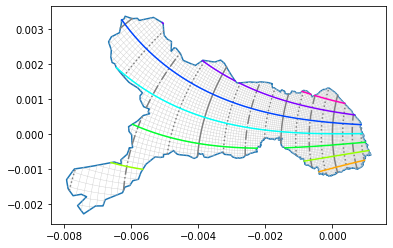

In [130]:
%matplotlib inline

fig, ax = plt.subplots()

def lemma3_3_(b):
    g1 = g1_(b)
    g3 = g3_(g2(-b))

    def lemma3_3(z):
        return g3(g2(g1(z)))

    return lemma3_3
        
def lemma3_3(b, polyline):
    return lemma3_3_(b)(polyline)

def create_normalized_lemma3_3(b, p, n=2.0):
    g1 = g1_(b)
    g3 = g3_(g2(-b))
    
    def lemma3_3(z):
        return g3(g2(g1(z), boundary=g1(p), n=n))
        
    return lemma3_3

test_polyline = lemma3_3(b_for_g, new_polyline)

lemma3_3_for_gridlines = create_normalized_lemma3_3(b_for_g, new_polyline)


x = test_polyline.real
y = test_polyline.imag
plt.plot(x,y)

test_grid_plotter = new_grid_plotter.transform(lemma3_3_for_gridlines)
test_grid_plotter.plot_all(ax, c='0.8', linewidth=0.4)
test_grid_plotter.plot(ax)




# Visualization of Lemma 7.2

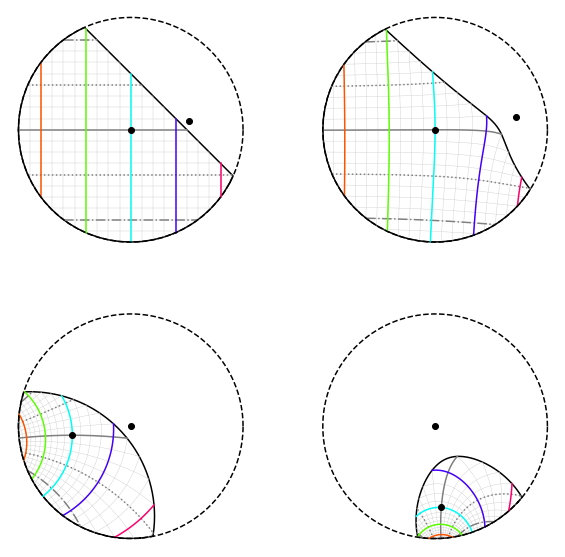

In [26]:
%matplotlib inline

a = 0.5
cut = shapely.geometry.Polygon([(-2, 2 + a), (2, -2 + a), (2, 2), (-2, 2 + a)])
circle = shapely.geometry.Point(0, 0).buffer(1)
domain = circle.difference(cut)

plot_circle = np.exp(np.linspace(0, 2j*np.pi, 256))

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10,10))
def do_it(sep=0.1, center=0, major_ticks=4, step=0.01):
    grid_plotter = GridPlotter.create(domain, sep=sep, center=center, major_ticks=major_ticks, step=step)

    polyline = to_path(domain.exterior.coords, step=0.01)
    b = 0.52 + 0.08j
    g1 = g1_(b)
    g3 = g3_(g2(-b))

    c = g2(-b, boundary=g1(polyline))
    transforms = [
        (lambda z: z,b),
        (g1,-b),
        (lambda z: g2(g1(z), boundary=g1(polyline)), c),
        (lambda z: g3(g2(g1(z), boundary=g1(polyline))), -c * np.exp(1j*np.angle(c))),
    ]
    ax_coords = {
        0: (0,0),
        1: (1,0),
        2: (1,1),
        3: (0,1),
    }
    for idx, (t, point) in enumerate(transforms):
        ax = axes[ax_coords[idx]]
        p = t(polyline)
        g = grid_plotter.transform(t)

        ax.set_aspect('equal')
        ax.plot(p.real, p.imag, c='k')
        ax.scatter(0, 0, zorder=3, c='k')
        g.plot_all(ax)
        g.plot(ax)
        ax.scatter(point.real, point.imag, zorder=3, c='k')
        ax.plot(plot_circle.real, plot_circle.imag, 'k--')
        ax.axis('off')
    

do_it()
# plt.savefig('lemma_7_2.eps', bbox_inches='tight')

# Visualization for a conformal mapping


In [32]:
from svgpathtools import parse_path
# Drawn with Inkscape with beziers
path1 = parse_path("m 34.6896,212.8896 c 0,0 -13.3056,-19.008 -8.078401,-28.9872 7.66997,-14.64267 32.788801,9.9792 29.937601,-6.6528 -2.8512,-16.632 -12.3552,-26.6112 -7.127999,-28.9872 5.227198,-2.376 12.355197,-3.3264 16.631999,0.9504")
path2 = parse_path("m 94.564799,197.208 c 0,0 -6.652801,21.8592 -34.2144,18.0576 -1.297467,-9.64167 22.908009,-33.59099 -30.888,-72.7056")



In [33]:
def scale_inside(lim, *point_lists):
    alls = np.array([p for points in point_lists for p in points])
    left = alls.real.min()
    right = alls.real.max()

    bottom = alls.imag.min()
    top = alls.imag.max()
    
    lim = np.array(lim)
    x_min, x_max = np.sort(lim.real)
    y_min, y_max = np.sort(lim.imag)

    x_scale_coeff = (x_max - x_min) / (right - left)
    y_scale_coeff = (y_max - y_min) / (top - bottom)
    
    scale = min([x_scale_coeff, y_scale_coeff])
        
    point_lists = [np.array(point_list) for point_list in point_lists]
    return [scale * (p - left - bottom*1j) + x_min + y_min*1j for p in point_lists]

def get_cubic_bezier_point(t, p):
    """
    Get the point on a cubic bezier on p while t in [0,1]
    
    For complex numbers modified from
    https://stackoverflow.com/a/67922796
    """
    multipliers = [
        t * t * t,
        3 * t * t * (1 - t),
        3 * t * (1 - t) * (1 - t),
        (1 - t) * (1 - t) * (1 - t)
    ]
    z = 0
    for index in range(4):
        z += p[index] * multipliers[index]
    return z

def get_points(points, step):
    return np.array([get_cubic_bezier_point(t, points) for t in np.arange(0, 1, step)])

def bezier_to_lines(path, step):
    return np.array([p for points in path[::-1] for p in get_points(points, step)])

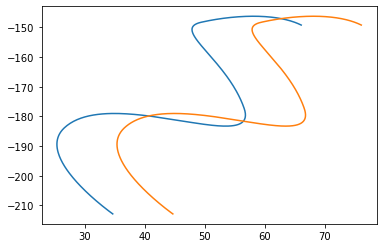

In [34]:
%matplotlib inline

for idx, step in enumerate([0.01, 0.001, 0.0001]):
    
    z = bezier_to_lines(path1, step)
    z = z + idx * 10
    
    plt.plot(z.real, -z.imag)
    if idx == 1:
        break


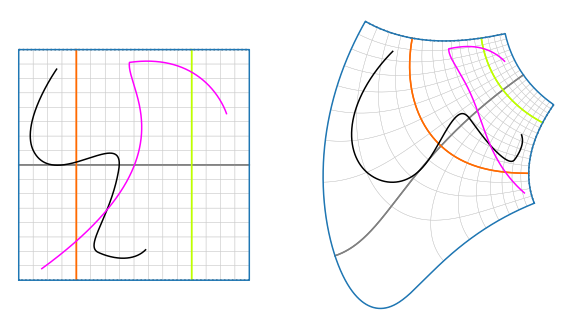

In [44]:
%matplotlib inline

def bezier_it():
    p1 = bezier_to_lines(path1, 0.0001)
    p2 = bezier_to_lines(path2, 0.0001)

    scaled = scale_inside([-0.9-0.9j, 0.9+0.9j], p1, p2)

    domain = create_square(2, translate=(-1, -1))
    grid_plotter = GridPlotter.create(domain, sep=0.125, center=2.5, major_ticks=8, step=0.0001)

    pl = to_path(domain.exterior.coords, step=0.0001)


    a, b, c, d = 0, 1, -0.5j, 1

    g_ = lambda z: (a*z + b) / (c*z+d)
    rot = lambda z: np.exp(2.5j) * z


    lemm = create_normalized_lemma3_3(3-25j, pl, n=4)


    lemm2 = create_normalized_lemma3_3(-24+1j, lemm(pl), n=13)
    lemm3 = create_normalized_lemma3_3(3+5j, lemm2(lemm(pl)), n=25)
    lemm4 = create_normalized_lemma3_3(-122+11j, lemm3(lemm2(lemm(pl))), n=117)
    g = lambda z: lemm4(lemm3(lemm2(lemm(z+1.01) +1.01)))


    colors = ['k', 'magenta']
    fig, axes = plt.subplots(ncols=2, figsize=(10,10))

    for idx, z in enumerate(scaled):
        ax = axes[0]
        ax.set_aspect('equal')

        ax.plot(z.real, z.imag, c=colors[idx], zorder=3)
        grid_plotter.plot_all(ax)
        grid_plotter.plot(ax)

        ax = axes[1]
        ax.set_aspect('equal')
        grr = grid_plotter.transform(g)
        grr.plot_all(ax)
        grr.plot(ax)
        z = g(z)

        ax.plot(z.real, z.imag, c=colors[idx], zorder=3)

    axes[0].plot(pl.real, pl.imag)
    axes[1].plot(g(pl).real, g(pl).imag)
    axes[0].axis('off')
    axes[1].axis('off')

bezier_it()
# plt.savefig('curvilinear.eps', bbox_inches='tight')

# Preparations for iterating the Riemann's mapping theorem

Repeated application of lemma 7.2 requires a repeated selection of a point outside the domain. Let's try out some alternatives.

In [48]:
def new_point_on_posreal(polyline, coeff=1.0/8):
    "Return a point on the positive real axis, outside the right-hand side of the `polyline`"
    return np.complex128(polyline.real.max() + coeff * (1 - polyline.real.max()))

def new_point_on_random_angle(polyline, coeff=1.0/8, rng=None):
    "Return a point outside the `polyline` when considering a random angle "
    if rng is None:
        rng = np.random.default_rng()
    # rotate the data with a random angle
    rotator = np.exp(2j * np.pi * rng.random())
    
    new_point = new_point_on_posreal(rotator * polyline, coeff)
    return new_point/rotator

def to_polygon(polyline):
    poly_coords = np.stack([polyline.real, polyline.imag], axis=1)
    # Complete the circle if necessary
    if not tuple(poly_coords[0]) == tuple(poly_coords[-1]):
        poly_coords = np.concatenate([poly_coords, [poly_coords[0]]])
    
    return shapely.geometry.Polygon(poly_coords)
    
def get_area(polyline):
    return to_polygon(polyline).area

def find_last(data):
    for elem in reversed(data):
        b, (p, *rest) = elem
        if p is not None:
            return elem


# Iterating the process

We pick a `b` in random and estimate if the area grew. If it didn't, select a new `b`.

# An outdated approach

Using the following approach did not work. However the code contains some interesting tools for analyzing the suitability of different points.


In [45]:
new_grid_segments = [segment for segment_coll in [new_grid_plotter.horizontal_gridlines, new_grid_plotter.vertical_gridlines] for segment in segment_coll]

0. round: Area coverage: 0.000006 -- 0.000000 failure ratio 
100. round: Area coverage: 0.607604 -- 0.030000 failure ratio 
200. round: Area coverage: 0.747498 -- 0.000000 failure ratio 
300. round: Area coverage: 0.789793 -- 0.010000 failure ratio 
400. round: Area coverage: 0.819299 -- 0.000000 failure ratio 
500. round: Area coverage: 0.842678 -- 0.000000 failure ratio 
600. round: Area coverage: 0.857051 -- 0.000000 failure ratio 
700. round: Area coverage: 0.868779 -- 0.000000 failure ratio 
800. round: Area coverage: 0.876016 -- 0.000000 failure ratio 
900. round: Area coverage: 0.881890 -- 0.000000 failure ratio 
CPU times: user 10min 18s, sys: 1.21 s, total: 10min 20s
Wall time: 10min 20s


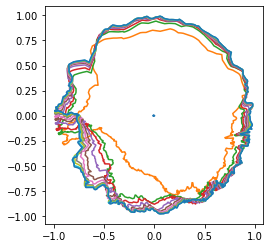

In [59]:
%%time
%matplotlib inline

fig, ax = plt.subplots()

num = 1000
save_every = 100
plot_every = save_every
print_ratio_every = plot_every

rng = np.random.default_rng(0)
p = new_polyline

grid = new_grid_plotter
new_data = []
counter = 0

for n in range(num):
    b = new_point_on_random_angle(p, 0.1 ,rng=rng)

    new_p = lemma3_3(b, p)

    if n % print_ratio_every == 0:
        ratio = get_area(p)/(np.pi)
        print(f"{n}. round: Area coverage: {ratio:1.6f} -- {counter/print_ratio_every:1.6f} failure ratio ")
        counter = 0

    # Estimate the area with the unsmoothed polyline
    if get_area(new_p) > get_area(p):

        grid = grid.transform(create_normalized_lemma3_3(b, p))
        p = new_p
        saving = (None, None)
        if n % save_every == 0:
            saving = (p, grid)
        new_data.append([b, saving])

        if n % plot_every == 0:
            ax.plot(p.real, p.imag)
    else:
        counter +=1
        continue


ax.plot(p.real, p.imag)
ax.set_aspect('equal')

Let's plot the grid segments for the last round.

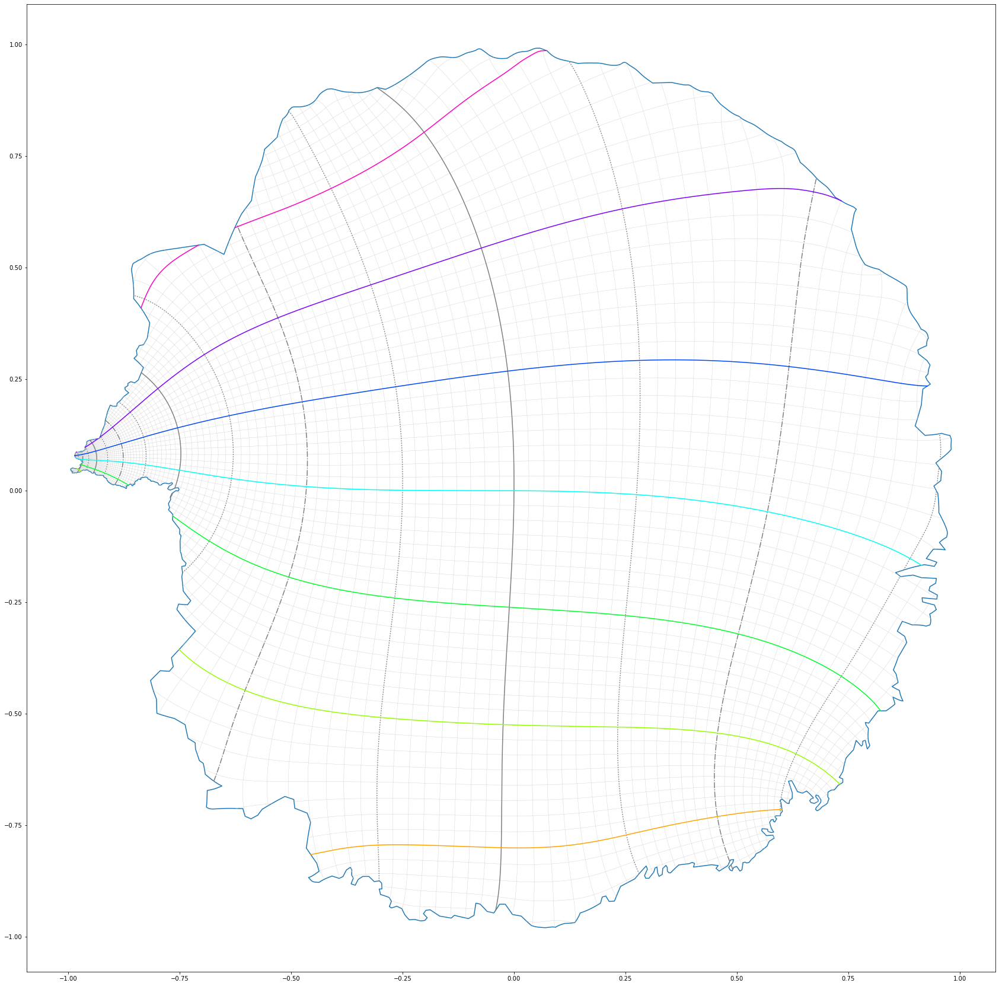

In [60]:
%matplotlib inline

b_newest, (p_newest, g_newest) = find_last(new_data)
fig, ax = plt.subplots(figsize=(30, 30))

ax.set_aspect('equal')
ax.plot(p_newest.real, p_newest.imag)

g_newest.plot_all(ax)
g_newest.plot(ax)


Okay, the area coverage does not seem to increase that much. Let's create a mesh between the unit disk and our mapping and find out the area increase in each point.

In [69]:
search_resolution = 300

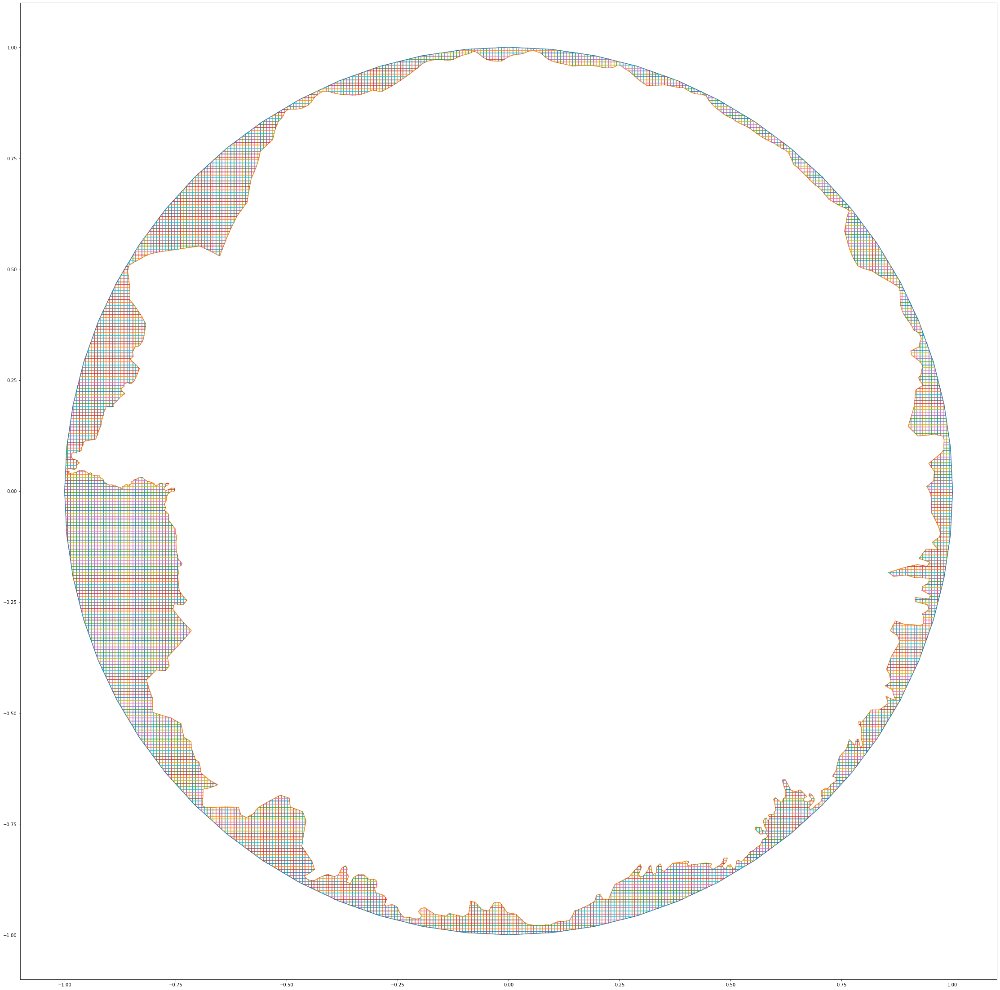

In [70]:
%matplotlib inline

xx = np.linspace(-1, 1, search_resolution)
yy = np.linspace(-1, 1, search_resolution)

horizontal_meshlines = [shapely.geometry.LineString([[-1, y], [1, y]]) for y in yy]
vertical_meshlines = [shapely.geometry.LineString([[x, 1], [x, -1]]) for x in xx]

fig, ax = plt.subplots(figsize=(40,40))
ax.set_aspect('equal')

unit_disk = shapely.geometry.Point([0., 0.]).buffer(1.0)
poly = to_polygon(p_newest)

# Intersect the lines with the polygon and the unit_disk
def get_the_missing_parts(meshline):
    return to_linestring_list(meshline.difference(poly).intersection(unit_disk))

vertical_meshlines = [segment for line in vertical_meshlines for segment in get_the_missing_parts(line)]
horizontal_meshlines = [segment for line in horizontal_meshlines for segment in get_the_missing_parts(line)]

intersections = [hori.intersection(vert) for hori in horizontal_meshlines for vert in vertical_meshlines if hori.crosses(vert)]


ax.plot(*unit_disk.exterior.xy)
ax.plot(*poly.exterior.xy)

for s in vertical_meshlines:
    ax.plot(*s.xy)

for s in horizontal_meshlines:
    ax.plot(*s.xy)

    


Then let's calculate the increase in area in each point.

In [82]:
intersections[0].

(array('d', [-0.11036789297658867]), array('d', [-0.9933110367892977]))

In [91]:
old_area = get_area(p_newest)
def get_area_comparison(b):
    return get_area(lemma3_3(b, p_newest)) / old_area

comparisons_with_coords = np.array([(get_area_comparison(complex(*b.coords[0])), b.x, b.y) for b in intersections])
comparisons = comparisons_with_coords[:,0]



In [84]:
np.log(comparisons[comparisons >= 1] - 1).max()

-12.094374521697267

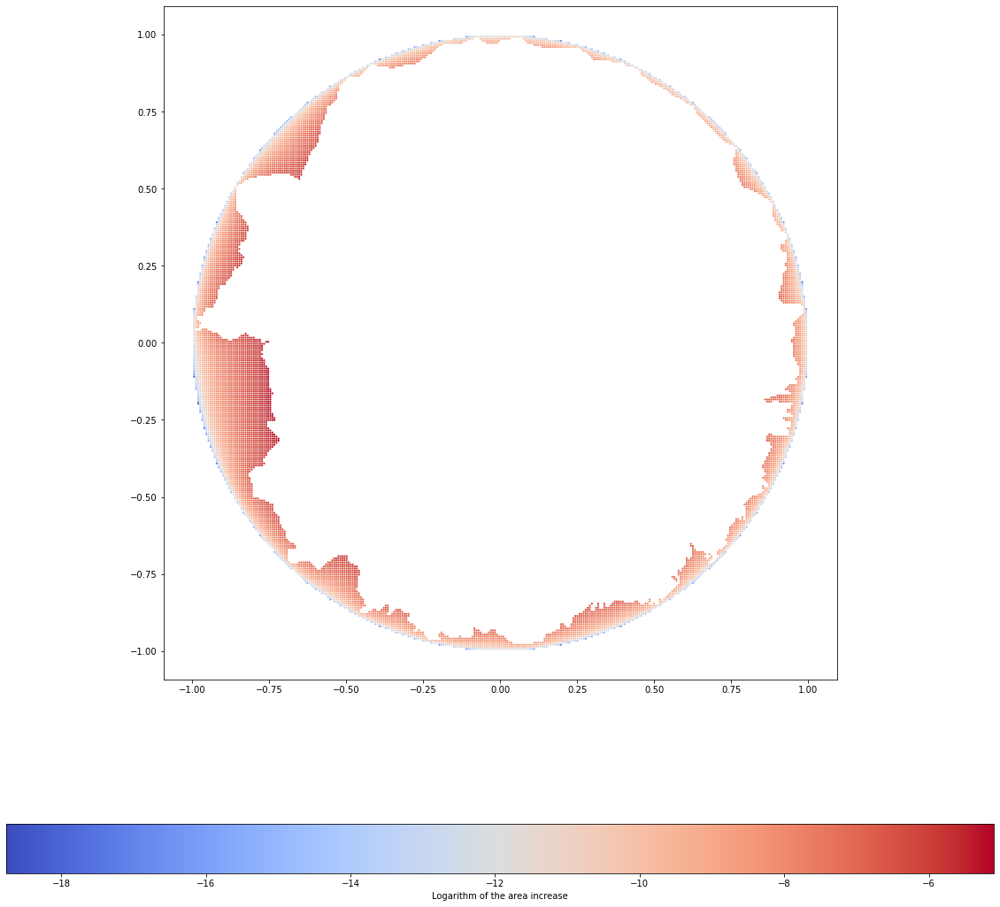

In [73]:
%matplotlib inline

from matplotlib import cm

mask = comparisons >= 1
grid_points = np.array([complex(*p.coords[0]) for p in intersections])

logss = np.log(comparisons[mask] - 1)
coordss = grid_points[mask]

fig, ax = plt.subplots(figsize=(20,20))
ax.set_aspect('equal')
plot = ax.scatter(coordss.real, coordss.imag, c=logss, s=0.4 * 1000 / search_resolution, cmap=cm.coolwarm)
cbar = fig.colorbar(plot, ax=ax, orientation='horizontal')
cbar.set_label('Logarithm of the area increase')


The points closest to the origin seem to yield good results.

In [101]:
print("Point closest to origin: ", p[np.absolute(p).argmin()])

print("Point with largest increase", comparisons_with_coords[comparisons.argmax()][1:])

Point closest to origin:  (-0.7558302289716503+0.005014964731052715j)
Point with largest increase [-0.73913043 -0.1638796 ]


New strategy: Pick the point closest to the origin and find a random point close to it which is inside the area

In [102]:
def is_inside(c, polyline):
    return to_polygon(polyline).covers(shapely.geometry.Point(c.real, c.imag))


def new_point_with_minimumish_modulus(p, coeff, rng=None):
    if rng is None:
        rng = np.random.default_rng()

    closest_to_origin = p[np.absolute(p).argmin()]
    def get_next():
        return closest_to_origin + (1 - np.absolute(closest_to_origin)) * coeff * np.exp(1j * (np.angle(closest_to_origin) + np.pi * (rng.random() - 0.5)))

    candidate = get_next()
    while is_inside(candidate, p):
        candidate = get_next()
    return candidate


(-0.021891796116109776, 0.028108203883890227)

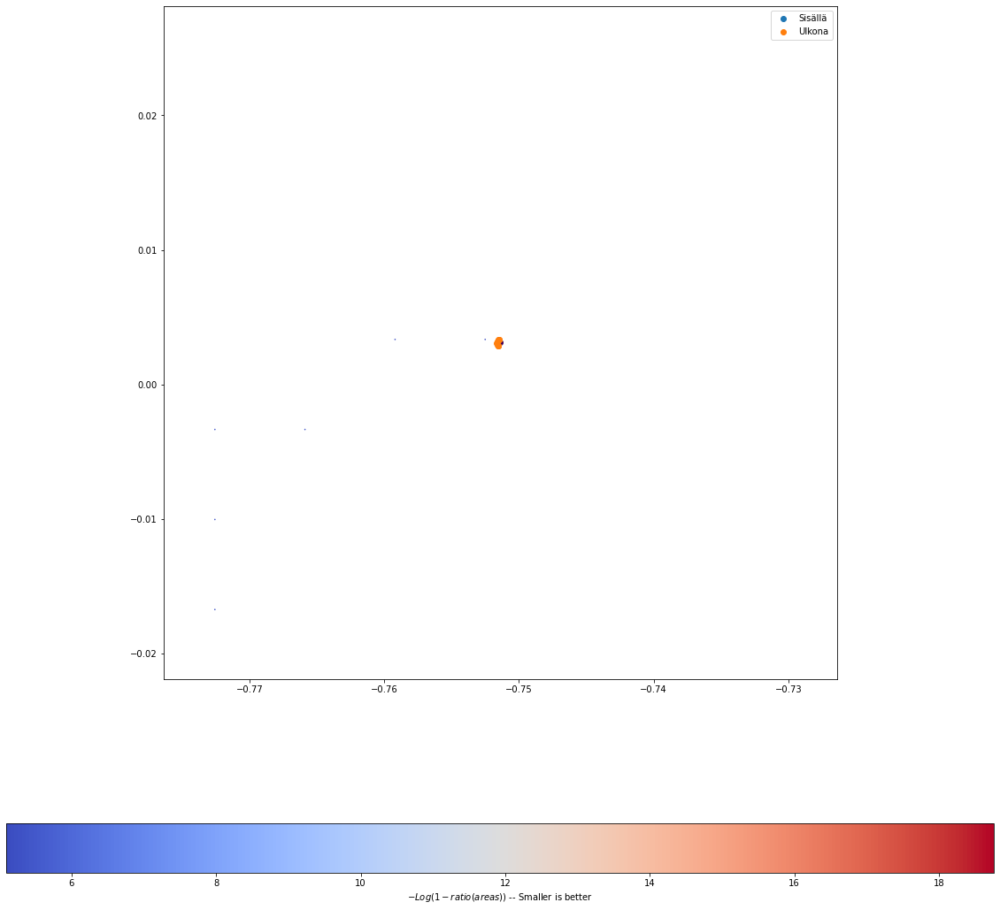

In [103]:
%matplotlib inline

from matplotlib import cm

mask = comparisons >= 1
grid_points = np.array([complex(*p.coords[0]) for p in intersections])

logss = np.log(comparisons[mask] - 1)
coordss = grid_points[mask]

fig, ax = plt.subplots(figsize=(20,20))
ax.set_aspect('equal')
plot = ax.scatter(coordss.real, coordss.imag, c=-logss, s=0.4, cmap=cm.coolwarm)
cbar = fig.colorbar(plot, ax=ax, orientation='horizontal')
cbar.set_label('$-Log(1-ratio(areas))$ -- Smaller is better')

closest_to_origin = p_newest[np.absolute(p_newest).argmin()]
ax.scatter(closest_to_origin.real, closest_to_origin.imag, c=30)
rng = np.random.default_rng(10)
random_points = np.array([new_point_with_minimumish_modulus(p_newest, 0.001, rng=rng) for _ in range(10)])
are_inside = np.array([is_inside(r, p_newest) for r in random_points])

ax.scatter(random_points[are_inside].real, random_points[are_inside].imag, label='Sisällä')
ax.scatter(random_points[~are_inside].real, random_points[~are_inside].imag, label='Ulkona')
ax.legend()
margin = 0.025
ax.set_xlim([closest_to_origin.real + v for v in [-margin, margin]])
ax.set_ylim([closest_to_origin.imag + v for v in [-margin, margin]])

So let's try again.

  0%|          | 0/17000 [00:00<?, ?it/s]

0. round: Area coverage: 0.000006 -- 0.000000 failure ratio 
1000. round: Area coverage: 0.986860 -- 0.000000 failure ratio 
2000. round: Area coverage: 0.993287 -- 0.000000 failure ratio 
3000. round: Area coverage: 0.995467 -- 0.000000 failure ratio 
4000. round: Area coverage: 0.996573 -- 0.000000 failure ratio 
5000. round: Area coverage: 0.997242 -- 0.000000 failure ratio 
6000. round: Area coverage: 0.997689 -- 0.000000 failure ratio 
7000. round: Area coverage: 0.998013 -- 0.000000 failure ratio 
8000. round: Area coverage: 0.998255 -- 0.000000 failure ratio 
9000. round: Area coverage: 0.998444 -- 0.000000 failure ratio 
10000. round: Area coverage: 0.998597 -- 0.000000 failure ratio 
11000. round: Area coverage: 0.998722 -- 0.000000 failure ratio 
12000. round: Area coverage: 0.998828 -- 0.000000 failure ratio 
13000. round: Area coverage: 0.998917 -- 0.000000 failure ratio 
14000. round: Area coverage: 0.998994 -- 0.000000 failure ratio 
15000. round: Area coverage: 0.999060 

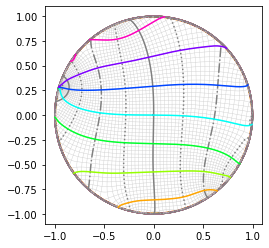

In [40]:
%%time
%matplotlib inline

fig, ax = plt.subplots()

num = 17000
save_every = 1
plot_every = 1000
print_ratio_every = 1000

rng = np.random.default_rng(0)

p = new_polyline

grid = new_grid_plotter

rerun_data = []
counter = 0


for n in (pbar := tqdm(range(num))):
    b = new_point_with_minimumish_modulus(p, 0.15 ,rng=rng)

    new_p = lemma3_3(b, p)

    if n % print_ratio_every == 0:
        ratio = get_area(p)/(np.pi)
        tqdm.write(f"{n}. round: Area coverage: {ratio:1.6f} -- {counter/print_ratio_every:1.6f} failure ratio ")
        counter = 0
    else:
        pbar.set_postfix({'coverage': get_area(p)/(np.pi)})

    # Estimate the area with the unsmoothed polyline
    if get_area(new_p) > get_area(p):

        lemma3_3_for_gridlines = create_normalized_lemma3_3(b, p)

        grid = grid.transform(lemma3_3_for_gridlines)
        p = new_p

        saving = (None, None)
        if n % save_every == 0:
            saving = (p, grid)
        rerun_data.append([b, saving])


        if n % plot_every == 0:
            ax.plot(p.real, p.imag)
    else:
        counter +=1
        continue


ax.plot(p.real, p.imag)
ax.set_aspect('equal')
grid.plot_all(ax, c='0.8', linewidth=0.4)
grid.plot(ax)
# for segment in grid:
#     ax.plot(segment.real, segment.imag)


In [105]:
import pickle

# with open('rerun_data.pickle', 'wb') as f:
#     pickle.dump(rerun_data, f, pickle.HIGHEST_PROTOCOL)

# with open('rerun_data.pickle', 'rb') as f:
#     rerun_data = pickle.load(f)

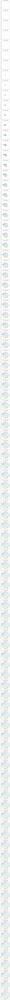

In [106]:
%matplotlib inline

n = 100
fig, axes = plt.subplots(nrows=n, figsize=(5,5*n))

for idx in range(0, n):
    ax = axes[idx]
    b, (p, g) = rerun_data[idx]
    
    ax.plot(p.real, p.imag)
    g.plot_all(ax, c='0.8', linewidth=0.4)
    g.major_ticks = 8
    g.creator = GridPlotter
    g = GridPlotter.copy(g)
    GridPlotter.plot(g, ax)
    ax.set_aspect('equal')
    ax.set_xlim(-1, 1)
    ax.set_ylim(-1, 1)
    ax.set_title(f'$n={idx}$, area-ratio={get_area(p)/np.pi:.4f}')

# Hand-picking some frames from the process


## Six frames with increasing coverage + a few zoomed-in boxes

Change `USE_APPROXIMATE_COVERAGE` to `True` to use the print-friendly percentages in the picture.

The following two code cells use hard-coded values for the rectangular boxes.

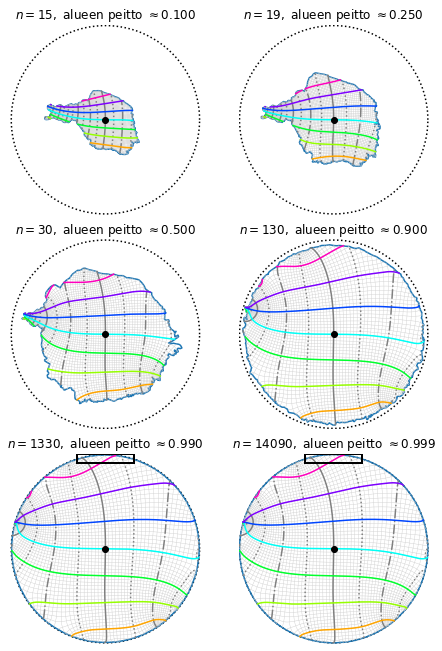

In [118]:
%matplotlib inline

USE_APPROXIMATE_COVERAGE = True

fig = plt.figure(figsize=(7.5, 12))

indices = [
    (15, 0.1),
    (19, 0.25),
    (30, 0.5),
    (130, 0.9),
    (1330, 0.99),
    (14090, 0.999),
]
plot_circle = np.exp(np.linspace(0, 2j*np.pi, 256))

for i, (idx, coverage) in enumerate(indices):
    ax = fig.add_subplot(320 + i + 1)
    ax.plot(plot_circle.real, plot_circle.imag, c='k', linestyle=':')
    ax.set_title(idx)

    b, (p, g) = rerun_data[idx]
    g = g.copy()
    ax.plot(p.real, p.imag)
    g.plot_all(ax, c='0.8', linewidth=0.4)

    ax.scatter(0, 0, c='k', zorder=14)
    GridPlotter.plot(g, ax)
    
    if USE_APPROXIMATE_COVERAGE:
        ax.set_title(r'$n=%d,$ alueen peitto $\approx%.3f$' % (idx, coverage))
    else:
        ax.set_title(r'$n=%d,$ alueen peitto $%.4f$' % (idx, get_area(p)/np.pi))

    ax.set_aspect('equal')
    ax.set_xlim(-1.01, 1.01)
    ax.set_ylim(-1.01, 1.01)
    
    ax.axis('off')
    
    if i >= 4:
        ax.add_patch( plt.Rectangle((-.3, 0.91),
                        .6, .1,
                        fc ='none', 
                        ec ='k',
                        lw = 2,
                                   zorder=12))

fig.subplots_adjust(hspace=-0.04)
plt.savefig('finland_process.eps', bbox_inches='tight')

## Zooming in on the border

Let's zoom in on the two boxes from the previous picture.

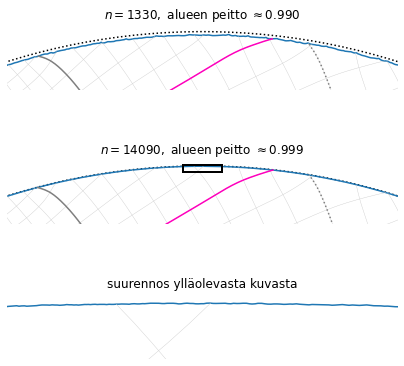

In [119]:
%matplotlib inline

fig = plt.figure(figsize=(7, 7))

indices = [
    (1330, 0.99),
    (14090, 0.999),
]
plot_circle = np.exp(np.linspace(0, 2j*np.pi, 256))

for i, (idx, coverage) in enumerate(indices):
    ax = fig.add_subplot(310 + i + 1)
    ax.plot(plot_circle.real, plot_circle.imag, c='k', linestyle=':')
    ax.set_title(idx)

    b, (p, g) = rerun_data[idx]
    g = g.copy()
    ax.plot(p.real, p.imag)
    g.plot_all(ax, c='0.8', linewidth=0.4)
    ax.scatter(0, 0, c='k', zorder=14)
    GridPlotter.plot(g, ax)

    ax.set_title(r'$n=%d,$ alueen peitto $\approx%.3f$' % (idx, coverage))
    ax.set_aspect('equal')
    ax.set_xlim(-.3, .3)
    ax.set_ylim(0.91, 1.01)
    
    ax.axis('off')


ax.add_patch( plt.Rectangle((-.03, 0.991),
                .06, .01,
                fc ='none', 
                ec ='k',
                lw = 2,
                           zorder=12))

ax = fig.add_subplot(313)
ax.plot(p.real, p.imag)
g.plot_all(ax, c='0.8', linewidth=0.4)
ax.scatter(0, 0, c='k', zorder=14)
GridPlotter.plot(g, ax)

ax.set_title(r'suurennos ylläolevasta kuvasta')
ax.set_aspect('equal')
ax.set_xlim(-.03, .03)
ax.set_ylim(0.991, 1.001)
ax.axis('off')

plt.savefig('finland_finer.eps', bbox_inches='tight')

In [121]:
del rerun_data

# Smoothed data

To animate the process it would be nice to have smooth transitions along the data. Currently `rerun_data` the area increase between sequential cells can be quite large. So we can either interpolate the change or try to minimize the change. Latter alternative was chosen here.

## First set of 20000 guesses

In [ ]:
%%time

%matplotlib inline

fig, ax = plt.subplots()

num = 20000
save_every = 1
plot_every = 10
print_ratio_every = plot_every

rng = np.random.default_rng(0)

p = new_polyline

grid = new_grid_plotter

smooth_data = []
counter = 0

coeff = .85

ascending = True
found = True

bound = 0.01

for n in range(num):
    b = new_point_with_minimumish_modulus(p, coeff ,rng=rng)
    
    new_p = lemma3_3(b, p)

    
    # Let's grow it a bit a bit faster in the start
    if n == 1000:
        bound = 0.005
    if n == 1250:
        bound = 0.001

    if n % print_ratio_every == 0:
        if counter == print_ratio_every:
            if ascending:
                if coeff > 0.99:
                    print ("Going down")
                    ascending = False
                    continue
                else:
                    print("Going bigger")
                    coeff = coeff + 0.01 *(1 - coeff)

            else:
                if coeff < 0.01:
                    ascending = True
                    if not found:
                        bound = bound / 10.
                        print("Lowering the bound by 90%")
                    else:
                        found = False
                    print("Going up")
                    continue
                else:
                    print("Going smaller")
                    coeff = 0.99 * coeff

        ratio = get_area(p)/(np.pi)
        print(f"{n}. round: Area coverage: {ratio:1.6f} -- {counter/print_ratio_every:1.6f} failure ratio ")
        counter = 0

    ratio = get_area(new_p) / get_area(p)        
    if ratio > 1 and ratio - 1 < bound and ratio - 1 > bound / 10.:
        found = True

        lemma3_3_for_gridlines = create_normalized_lemma3_3(b, p)
        
        grid = grid.transform(lemma3_3_for_gridlines)
        p = new_p

        saving = (None, None)
        if n % save_every == 0:
            saving = (p, grid)
        smooth_data.append([b, saving])


        if n % plot_every == 0:
            ax.plot(p.real, p.imag)
    else:
        counter +=1
        continue


ax.plot(p.real, p.imag)
ax.set_aspect('equal')
grid.plot_all(ax, c='0.8', linewidth=0.4)
grid.plot(ax)

Actually the first 20000 guesses don't yield that many results. So let's keep at it.

In [ ]:
# After 20000 rounds we're at
rng.bit_generator.state

In [ ]:
# with open('smooth_data.pickle', 'wb') as f:
#     pickle.dump(smooth_data, f, pickle.HIGHEST_PROTOCOL)

# with open('smooth_data.pickle', 'rb') as f:
#     smooth_data = pickle.load(f)

## Second set of 20000 guesses

In [ ]:
%%time
%matplotlib inline

# DOING 

fig, ax = plt.subplots()

num = 20000
save_every = 1
plot_every = 10
print_ratio_every = plot_every

rng.bit_generator.state = {'bit_generator': 'PCG64',
 'state': {'state': 119256327432166077766721251896883196243,
  'inc': 87136372517582989555478159403783844777},
 'has_uint32': 0,
 'uinteger': 0}


_, (p, grid) = find_last(smooth_data)

counter = 0

coeff = .85

ascending = True
found = True

# Keep the bound as it is
# bound = 0.01

for n in range(num):
    b = new_point_with_minimumish_modulus(p, coeff ,rng=rng)
    
    new_p = lemma3_3(b, p)

    if n % print_ratio_every == 0:
        if counter == print_ratio_every:
            if ascending:
                if coeff > 0.99:
                    print ("Going down")
                    ascending = False
                    continue
                else:
                    print("Going bigger")
                    coeff = coeff + 0.01 *(1 - coeff)

            else:
                if coeff < 0.01:
                    ascending = True
                    if not found:
                        bound = bound / 10.
                        print("Lowering the bound by 90%")
                    else:
                        found = False
                    print("Going up")
                    continue
                else:
                    print("Going smaller")
                    coeff = 0.99 * coeff

        ratio = get_area(p)/(np.pi)
        print(f"{n}. round: Area coverage: {ratio:1.6f} -- {counter/print_ratio_every:1.6f} failure ratio ")
        counter = 0

    ratio = get_area(new_p) / get_area(p)        
    if ratio > 1 and ratio - 1 < bound and ratio - 1 > bound / 10.:
        found = True

        lemma3_3_for_gridlines = create_normalized_lemma3_3(b, p)
        
        grid = grid.transform(lemma3_3_for_gridlines)
        p = new_p

        saving = (None, None)
        if n % save_every == 0:
            saving = (p, grid)
        smooth_data.append([b, saving])


        if n % plot_every == 0:
            ax.plot(p.real, p.imag)
    else:
        counter +=1
        continue


ax.plot(p.real, p.imag)
ax.set_aspect('equal')
grid.plot_all(ax, c='0.8', linewidth=0.4)
grid.plot(ax)

There still aren't that many results so let's keep at it.

In [ ]:
# with open('smooth_data_40000.pickle', 'wb') as f:
#     pickle.dump(smooth_data, f, pickle.HIGHEST_PROTOCOL)

## Third set of 20000 guesses

In [ ]:
%%time
%matplotlib inline

# DOING 

fig, ax = plt.subplots()

num = 20000
save_every = 1
plot_every = 10
print_ratio_every = plot_every

rng.bit_generator.state = {'bit_generator': 'PCG64',
 'state': {'state': 98734651020251006483289666537832999518,
  'inc': 87136372517582989555478159403783844777},
 'has_uint32': 0,
 'uinteger': 0}


_, (p, grid) = find_last(smooth_data)

counter = 0

ascending = False
found = True

# Keep the bound and coeff as they are
# bound = 0.01
# coeff = .85

for n in range(num):
    b = new_point_with_minimumish_modulus(p, coeff ,rng=rng)
    
    new_p = lemma3_3(b, p)

    if n % print_ratio_every == 0:
        if counter == print_ratio_every:
            if ascending:
                if coeff > 0.99:
                    print ("Going down")
                    ascending = False
                    continue
                else:
                    print("Going bigger")
                    coeff = coeff + 0.01 *(1 - coeff)

            else:
                if coeff < 0.01:
                    ascending = True
                    if not found:
                        bound = bound / 10.
                        print("Lowering the bound by 90%")
                    else:
                        found = False
                    print("Going up")
                    continue
                else:
                    print("Going smaller")
                    coeff = 0.99 * coeff

        ratio = get_area(p)/(np.pi)
        print(f"{n}. round: Area coverage: {ratio:1.6f} -- {counter/print_ratio_every:1.6f} failure ratio ")
        counter = 0

    ratio = get_area(new_p) / get_area(p)        
    if ratio > 1 and ratio - 1 < bound and ratio - 1 > bound / 10.:
        found = True

        lemma3_3_for_gridlines = create_normalized_lemma3_3(b, p)
        
        grid = grid.transform(lemma3_3_for_gridlines)
        p = new_p

        saving = (None, None)
        if n % save_every == 0:
            saving = (p, grid)
        smooth_data.append([b, saving])


        if n % plot_every == 0:
            ax.plot(p.real, p.imag)
    else:
        counter +=1
        continue


ax.plot(p.real, p.imag)
ax.set_aspect('equal')
grid.plot_all(ax, c='0.8', linewidth=0.4)
grid.plot(ax)

## Fourth set of 20000 guesses

In [ ]:
%%time
%matplotlib inline

fig, ax = plt.subplots()

num = 20000
save_every = 1
plot_every = 10
print_ratio_every = plot_every

rng.bit_generator.state = {'bit_generator': 'PCG64',
 'state': {'state': 38292042669604578411112789110351150548,
  'inc': 87136372517582989555478159403783844777},
 'has_uint32': 0,
 'uinteger': 0}


_, (p, grid) = find_last(smooth_data)

counter = 0

# Keep the bound and coeff as they are
# bound = 0.01
# coeff = .85

for n in range(num):
    b = new_point_with_minimumish_modulus(p, coeff ,rng=rng)
    
    new_p = lemma3_3(b, p)

    if n % print_ratio_every == 0:
        if counter == print_ratio_every:
            if ascending:
                if coeff > 0.99:
                    print ("Going down")
                    ascending = False
                    continue
                else:
                    print("Going bigger")
                    coeff = coeff + 0.01 *(1 - coeff)

            else:
                if coeff < 0.01:
                    ascending = True
                    if not found:
                        bound = bound / 10.
                        print("Lowering the bound by 90%")
                    else:
                        found = False
                    print("Going up")
                    continue
                else:
                    print("Going smaller")
                    coeff = 0.99 * coeff

        ratio = get_area(p)/(np.pi)
        print(f"{n}. round: Area coverage: {ratio:1.6f} -- {counter/print_ratio_every:1.6f} failure ratio ")
        counter = 0

    ratio = get_area(new_p) / get_area(p)        
    if ratio > 1 and ratio - 1 < bound and ratio - 1 > bound / 10.:
        found = True

        lemma3_3_for_gridlines = create_normalized_lemma3_3(b, p)
        
        grid = grid.transform(lemma3_3_for_gridlines)
        p = new_p

        saving = (None, None)
        if n % save_every == 0:
            saving = (p, grid)
        smooth_data.append([b, saving])


        if n % plot_every == 0:
            ax.plot(p.real, p.imag)
    else:
        counter +=1
        continue


ax.plot(p.real, p.imag)
ax.set_aspect('equal')
grid.plot_all(ax, c='0.8', linewidth=0.4)
grid.plot(ax)

In [ ]:
rng.bit_generator.state

In [ ]:
# with open('smooth_data_60000.pickle', 'wb') as f:
#     pickle.dump(smooth_data, f, pickle.HIGHEST_PROTOCOL)

## Fifth set of 20000 guesses

In [ ]:
%%time
%matplotlib inline

# DOING 

fig, ax = plt.subplots()

num = 20000
save_every = 1
plot_every = 10
print_ratio_every = plot_every

rng.bit_generator.state = {'bit_generator': 'PCG64',
 'state': {'state': 210255339218941087788811317257000594984,
  'inc': 87136372517582989555478159403783844777},
 'has_uint32': 0,
 'uinteger': 0}


_, (p, grid) = find_last(smooth_data)

counter = 0

# Keep the bound and coeff as they are
# bound = 0.01
# coeff = .85
# ascending = True
# found = True

for n in range(num):
    b = new_point_with_minimumish_modulus(p, coeff ,rng=rng)
    
    new_p = lemma3_3(b, p)

    if n % print_ratio_every == 0:
        if counter == print_ratio_every:
            if ascending:
                if coeff > 0.99:
                    print ("Going down")
                    ascending = False
                    continue
                else:
                    print("Going bigger")
                    coeff = coeff + 0.01 *(1 - coeff)

            else:
                if coeff < 0.01:
                    ascending = True
                    if not found:
                        bound = bound / 10.
                        print("Lowering the bound by 90%")
                    else:
                        found = False
                    print("Going up")
                    continue
                else:
                    print("Going smaller")
                    coeff = 0.99 * coeff

        ratio = get_area(p)/(np.pi)
        print(f"{n}. round: Area coverage: {ratio:1.6f} -- {counter/print_ratio_every:1.6f} failure ratio ")
        counter = 0

    ratio = get_area(new_p) / get_area(p)        
    if ratio > 1 and ratio - 1 < bound and ratio - 1 > bound / 10.:
        found = True

        lemma3_3_for_gridlines = create_normalized_lemma3_3(b, p)
        
        grid = grid.transform(lemma3_3_for_gridlines)
        p = new_p

        saving = (None, None)
        if n % save_every == 0:
            saving = (p, grid)
        smooth_data.append([b, saving])


        if n % plot_every == 0:
            ax.plot(p.real, p.imag)
    else:
        counter +=1
        continue


ax.plot(p.real, p.imag)
ax.set_aspect('equal')
grid.plot_all(ax, c='0.8', linewidth=0.4)
grid.plot(ax)

In [ ]:
# with open('smooth_data_80000.pickle', 'wb') as f:
#     pickle.dump(smooth_data, f, pickle.HIGHEST_PROTOCOL)

In [ ]:
rng.bit_generator.state

## Sixth set of 20000 guesses

In [ ]:
%%time
%matplotlib inline

# DOING 

fig, ax = plt.subplots()

num = 20000
save_every = 1
plot_every = 10
print_ratio_every = plot_every

rng.bit_generator.state = {'bit_generator': 'PCG64',
 'state': {'state': 37964870677012289486609537661059365027,
  'inc': 87136372517582989555478159403783844777},
 'has_uint32': 0,
 'uinteger': 0}


_, (p, grid) = find_last(smooth_data)

counter = 0

# Keep the bound and coeff as they are
# bound = 0.01
# coeff = .85
# ascending = True
# found = True

for n in range(num):
    b = new_point_with_minimumish_modulus(p, coeff ,rng=rng)
    
    new_p = lemma3_3(b, p)

    if n % print_ratio_every == 0:
        if counter == print_ratio_every:
            if ascending:
                if coeff > 0.99:
                    print ("Going down")
                    ascending = False
                    continue
                else:
                    print("Going bigger")
                    coeff = coeff + 0.01 *(1 - coeff)

            else:
                if coeff < 0.01:
                    ascending = True
                    if not found:
                        bound = bound / 10.
                        print("Lowering the bound by 90%")
                    else:
                        found = False
                    print("Going up")
                    continue
                else:
                    print("Going smaller")
                    coeff = 0.99 * coeff

        ratio = get_area(p)/(np.pi)
        print(f"{n}. round: Area coverage: {ratio:1.6f} -- {counter/print_ratio_every:1.6f} failure ratio ")
        counter = 0

    ratio = get_area(new_p) / get_area(p)        
    if ratio > 1 and ratio - 1 < bound and ratio - 1 > bound / 10.:
        found = True

        lemma3_3_for_gridlines = create_normalized_lemma3_3(b, p)
        
        grid = grid.transform(lemma3_3_for_gridlines)
        p = new_p

        saving = (None, None)
        if n % save_every == 0:
            saving = (p, grid)
        smooth_data.append([b, saving])


        if n % plot_every == 0:
            ax.plot(p.real, p.imag)
    else:
        counter +=1
        continue


ax.plot(p.real, p.imag)
ax.set_aspect('equal')
grid.plot_all(ax, c='0.8', linewidth=0.4)
grid.plot(ax)

In [122]:
# with open('smooth_data_80000_and_then_some.pickle', 'wb') as f:
#     pickle.dump(smooth_data, f, pickle.HIGHEST_PROTOCOL)

# with open('smooth_data_80000_and_then_some.pickle', 'rb') as f:
#     smooth_data = pickle.load(f)

# Generating the video

Change the value of `ANIMATION_OUTPUT` for an HTML animation or a video file output.

In [137]:
# Possible values: 'show' and 'video'
ANIMATION_OUTPUT = 'show'
FILE_NAME = 'riemann_mapping_theorem_visualized.mp4'

...then run the following cell.

<IPython.core.display.Javascript object>


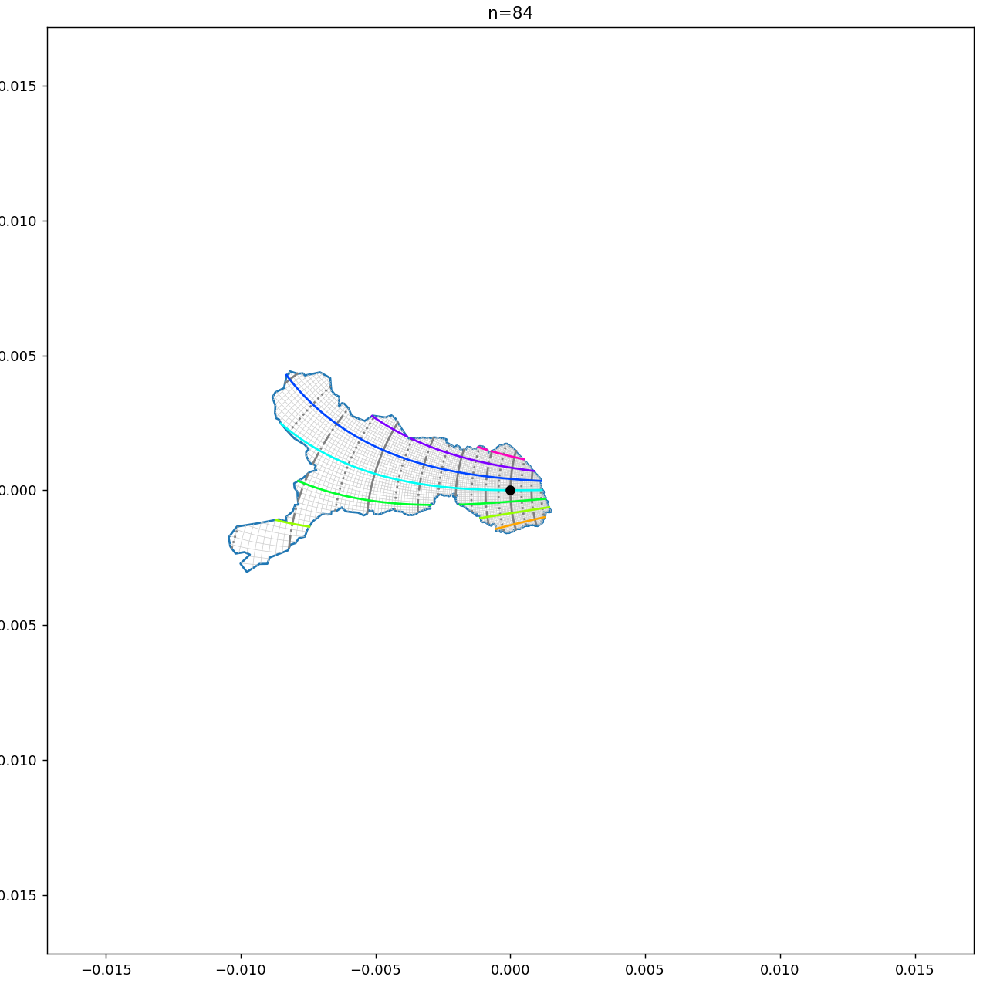

CPU times: user 410 ms, sys: 97.8 ms, total: 508 ms
Wall time: 194 ms


/opt/homebrew/anaconda3/envs/fresh/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1298: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


In [139]:
%%time
%matplotlib notebook

import datetime
import matplotlib
import matplotlib.pyplot as plt

from matplotlib import animation

if ANIMATION_OUTPUT == 'video':
    matplotlib.use("Agg")

dpi = 1080/10
dpi = 2160/10.
fig, ax = plt.subplots(figsize=(10,10))
fig.tight_layout()

data = smooth_data

(b, (p, g)), *rest_of_data = data

line, = ax.plot(p)
g.creator = GridPlotter
grid = GridPlotter.copy(g)._get_plots_for_animation(ax)

start = datetime.datetime.now()

def get_lim(points):
    "Get a bounding box for points with a logarithmically increasing size"
    x_max = np.abs(points.real).max()
    y_max = np.abs(points.imag).max()
    max_reach = max(x_max, y_max)
    
    lim = 2 ** np.ceil(np.log2(max_reach))
    lim = min(lim, 1)
    return np.array([-lim, lim])


padding = 1.1
ax.set_xlim(padding * get_lim(p))
ax.set_ylim(padding * get_lim(p))
ax.set_aspect('equal')

ax.scatter(0, 0, c='k', zorder=13)

plot_circle = np.exp(np.linspace(0, 2j*np.pi, 256))
circle_plot, = ax.plot(plot_circle.real, plot_circle.imag, 'k:')

def animate(frame_num):
    b, (p, g) = rest_of_data[frame_num]
    line.set_data((p.real, p.imag))

    lim = get_lim(p)
    ax.set_xlim(padding * lim)
    ax.set_ylim(padding * lim)
    if np.any(lim == 1.0):
        ax.axis('off')

    if frame_num % 1000 == 0:
        print(f"at {frame_num} after {(datetime.datetime.now() - start).total_seconds():.1f}")
    if np.any(np.abs(p) > 0.999):
        circle_plot.set_visible(False)

    ax.set_title(f'n={frame_num}')
    g.creator = GridPlotter
    for idx, segment in enumerate(GridPlotter.copy(g)._get_segments_for_animation()):
        grid[idx].set_data((segment.real, segment.imag))

    return [line, circle_plot] + list(grid)

if ANIMATION_OUTPUT == 'show':    
    anim = animation.FuncAnimation(fig, animate, frames=len(rest_of_data), interval=0.25)
    plt.show()

if ANIMATION_OUTPUT == 'video':
    file_name = FILE_NAME 
    writervideo = animation.FFMpegWriter(fps=60, bitrate=-1)#, extra_args=['-scale', '1080x1080']) 

    with writervideo.saving(fig, file_name, dpi=dpi):
        for frame_num in tqdm(range(len(rest_of_data))):
            b, (p, g) = rest_of_data[frame_num]
            line.set_data((p.real, p.imag))

            lim = get_lim(p)
            ax.set_xlim(padding * lim)
            ax.set_ylim(padding * lim)
            if np.any(lim == 1.0):
                ax.axis('off')

            if np.any(np.abs(p) > 0.999):
                circle_plot.set_visible(False)

            ax.set_title(f'n={frame_num}')
            g.creator = GridPlotter
            for idx, segment in enumerate(GridPlotter.copy(g)._get_segments_for_animation()):
                grid[idx].set_data((segment.real, segment.imag))


            writervideo.grab_frame()

In [141]:
del smooth_data

# Final words

The code is not numerically efficient. The code could be vectorized in many places and the execution would be much faster on GPU. However it is a project for another time.